In [1]:
from pycaret.classification import *
import pandas as pd
import os
import seaborn as sns
import matplotlib.pyplot as plt
os.chdir('/home/antoine/gene_pheno_pred')


In [2]:
# Load training set
train = pd.read_csv('/home/antoine/gene_pheno_pred/non-reified_ComplEx_2023-05-04_17-19-26_kg_train.csv' , header=0)
test = pd.read_csv('/home/antoine/gene_pheno_pred/non-reified_ComplEx_2023-05-04_17-19-26_kg_test.csv' , header=0)

# add column to identify train, test and val
train['set'] = 'train'
test['set'] = 'test'

# Merge train, test and val
df = pd.concat([train, test], axis=0)
df = df[~(df['relation'] == 'no_link_known')] # Drop negatives
df

,0,1,2,3,4,5,6,7,8,9,...,194,195,196,197,198,199,head,relation,tail,set
1,-0.063572,0.042947,-0.020576,0.076487,0.004286,-0.080103,-0.018370,0.054732,-0.073183,0.012134,...,0.006206,0.052330,-0.035846,0.011465,0.056336,0.061813,https://wormbase.org/species/c_elegans/gene/WB...,http://purl.obolibrary.org/obo/RO_0002436,https://wormbase.org/species/c_elegans/gene/WB...,train
2,-0.034408,-0.039379,-0.041705,0.016972,0.036839,0.030759,0.015173,-0.023861,0.022699,-0.002807,...,0.038604,-0.002525,0.023441,-0.023203,-0.003573,-0.023536,https://wormbase.org/species/c_elegans/gene/WB...,http://semanticscience.org/resource/SIO_001279,https://wormbase.org/species/all/phenotype/WBP...,train
3,-0.068742,-0.059267,-0.031678,0.046586,-0.004413,0.066507,-0.020109,-0.060134,0.065552,-0.027575,...,0.020175,-0.047355,-0.002580,-0.010567,-0.062975,-0.026971,https://wormbase.org/species/c_elegans/gene/WB...,http://purl.obolibrary.org/obo/RO_0002436,https://wormbase.org/species/c_elegans/gene/WB...,train
6,-0.068490,-0.066202,-0.032557,0.061942,-0.004055,0.063589,-0.009571,-0.055806,0.057752,-0.032322,...,0.156480,0.146515,0.138802,-0.123609,-0.131612,-0.131504,https://wormbase.org/species/c_elegans/gene/WB...,http://semanticscience.org/resource/SIO_001279,https://wormbase.org/species/all/phenotype/WBP...,train
9,0.022260,0.028051,-0.039697,0.025357,0.036425,-0.037961,-0.032076,-0.030062,0.028645,-0.029327,...,-0.158322,0.144730,0.093162,0.152979,-0.073129,0.157795,https://wormbase.org/species/c_elegans/gene/WB...,http://purl.obolibrary.org/obo/RO_0002206,https://wormbase.org/search/life_stage/0000533,train
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
134390,0.008452,0.000315,-0.011129,0.003016,0.010367,0.013353,-0.020484,-0.017039,-0.006704,0.018925,...,0.005912,-0.021865,-0.008104,-0.003813,-0.021491,-0.019171,https://wormbase.org/species/c_elegans/gene/WB...,http://purl.obolibrary.org/obo/RO_0002206,https://wormbase.org/search/life_stage/0000021,test
134395,0.012107,-0.013611,-0.018994,-0.025644,0.009893,0.010356,-0.022550,-0.011620,-0.007539,0.010931,...,0.022702,0.000721,-0.016443,0.024818,-0.024366,-0.024455,https://wormbase.org/species/c_elegans/gene/WB...,http://www.w3.org/1999/02/22-rdf-syntax-ns#type,http://semanticscience.org/resource/SIO_000790,test
134396,0.026323,0.007518,-0.023498,-0.012793,0.010837,-0.020100,0.000583,-0.000458,-0.031198,-0.009085,...,-0.001538,-0.014020,-0.000058,-0.009329,-0.005229,-0.022455,https://wormbase.org/species/c_elegans/gene/WB...,http://purl.obolibrary.org/obo/RO_0002436,https://wormbase.org/species/c_elegans/gene/WB...,test
134397,0.025879,-0.005200,-0.011589,-0.006335,0.013164,0.018577,0.012160,0.004093,-0.012093,0.026272,...,0.000260,-0.012139,-0.029591,-0.018536,-0.003055,-0.013181,https://wormbase.org/species/c_elegans/gene/WB...,http://purl.obolibrary.org/obo/RO_0002206,https://wormbase.org/search/life_stage/0000041,test


In [3]:
# split combined embeddings into individual nodes
df1 = df.iloc[:, :100] # Head node
df2 = df.iloc[:, 100:200] # Tail node

# Add column to identify head and tail node
df1['node'] = df['head']
df2['node'] = df['tail']
df1['set'] = df['set']
df2['set'] = df['set']

# drop indexes
df1 = df1.reset_index(drop=True)
df2 = df2.reset_index(drop=True)

# rename columns of df2 to be the same as df1
df2.columns = df1.columns

# merge the two dataframes
df = pd.concat([df1, df2], axis=0)

# Count the number of times a node appears in the dataset and add the count as a column
df['connectivity'] = df.groupby('node')['node'].transform('count')
df = df.sample(frac=1)  # Shuffle the DataFrame

# Reset the index of the shuffled DataFrame
df = df.reset_index(drop=True)
df = df.drop_duplicates(subset=['node'])
df

,0,1,2,3,4,5,6,7,8,9,...,93,94,95,96,97,98,99,node,set,connectivity
0,0.030463,0.030900,-0.039356,0.040957,0.025086,-0.036631,-0.028084,-0.034740,0.028853,-0.024516,...,-0.033955,0.038834,-0.025608,0.028056,0.030899,-0.025285,0.040308,https://wormbase.org/species/c_elegans/gene/WB...,train,477
1,0.019333,0.001714,-0.001421,-0.006130,0.021098,0.012323,-0.010561,-0.002355,-0.006035,0.010042,...,0.025016,0.012664,-0.023428,-0.008277,0.000690,-0.023978,-0.007377,https://wormbase.org/species/c_elegans/gene/WB...,test,32
2,0.144234,0.186064,0.178157,0.157750,-0.171776,-0.108337,-0.003917,0.178151,0.178949,0.154063,...,-0.171103,-0.174937,0.151765,0.085975,0.171606,-0.095304,0.157479,https://wormbase.org/search/life_stage/0000291,train,311
3,0.121419,0.155618,0.153160,0.141020,-0.158680,-0.079338,0.145332,0.158542,0.153480,0.139543,...,-0.150417,-0.159615,0.125330,0.070716,0.151493,-0.070787,0.145450,https://wormbase.org/search/life_stage/0000482,train,140
4,0.036037,-0.025898,0.019111,-0.022322,-0.020301,0.002814,-0.015345,0.013594,0.024695,-0.013340,...,-0.023585,-0.018432,0.020190,-0.031318,-0.020687,0.028733,-0.031222,https://wormbase.org/species/c_elegans/gene/WB...,train,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
783360,0.031163,-0.038515,0.031590,-0.016689,-0.021735,0.003322,-0.027388,0.001686,0.025910,-0.008438,...,-0.015731,-0.017994,0.021055,-0.030446,-0.028905,0.037924,-0.023925,https://wormbase.org/species/c_elegans/gene/WB...,train,1
783362,0.012667,-0.014090,-0.000726,-0.023685,-0.003966,0.007353,-0.000396,-0.004706,-0.018271,0.015968,...,0.027394,0.006072,-0.017315,-0.001587,-0.009279,-0.021950,-0.004612,https://disease-ontology.org/?id=DOID:8427,train,1
783419,0.010380,-0.001498,-0.013972,-0.009414,0.014685,0.011497,-0.005751,0.008476,-0.018130,0.016597,...,0.031877,0.002612,-0.012194,-0.020092,0.000619,-0.011134,-0.022267,21ur-6140,train,1
783436,-0.011224,-0.041089,-0.024969,-0.019222,0.023378,-0.001834,-0.016738,-0.006987,-0.000547,-0.000080,...,0.019968,0.009291,-0.005488,-0.007422,-0.017077,-0.017755,0.011869,let-263,train,1


In [4]:
# Select only embeddings
df_tsne_num = df.iloc[:, :100]

# Apply TSNE
import numpy as np
import pandas as pd
# Import TSNE
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

In [5]:
tsne = TSNE(n_components=2)  # Specify the number of components you want to keep
tsne_result = tsne.fit_transform(df_tsne_num)
df_tsne = pd.DataFrame(data=tsne_result, columns=['TSNE1', 'TSNE2'])

In [6]:
# transform embedding into dataframe
df_tsne.columns = ['TSNE1', 'TSNE2']

df_tsne.reset_index(drop=True, inplace=True)
df.reset_index(drop=True, inplace=True)

df_tsne['node'] = df['node']
df_tsne['set'] = df['set']
df_tsne['connectivity'] = df['connectivity']

# Create a new column with the merged string excluding the last index
df_tsne['node_type'] = df_tsne['node'].apply(lambda x: '/'.join(x[:-1]))
df_tsne['node_type'] = df_tsne['node'].replace('', 'labels')

# Define the ranges and labels for the connectivity groups
ranges = [0, 1, 2, 3, 4, 10, 100, 1000, 10000, float('inf')]
labels = ['1', '2', '3', '4', '5-10', '11-100', '101-1000', '1001-10000', '10001+']

# Create the 'grouped_connectivity' column
df_tsne['grouped_connectivity'] = pd.cut(df_tsne['connectivity'], bins=ranges, labels=labels, right=True)

# Function to replace the column values
def replace_url(url):
    parts = url.split('-')
    if len(parts) > 1:
        url = url.replace('-' + parts[-1], '')
        if 'https' in url:
            return url
        else:
            return ''
    else:
        return '/'.join(url.split('/')[:-1])

# Create a new column with the merged string excluding the last index
df_tsne['node_type'] = df_tsne['node_type'].apply(replace_url)
df_tsne['node_type'] = df_tsne['node_type'].replace('', 'labels')

print(df_tsne['node_type'].unique())

# Define the dictionary mapping
replacement_dict = {
    'https://wormbase.org/wbdata/ortho_dis': 'Ortholog disease',
    'https://wormbase.org/wbdata/pheno': 'Phenotype Annotation',
    'https://wormbase.org/wbinter': 'Interaction Annotation',
    'https://wormbase.org/wbdata/dis': 'Disease Annotation',
    'https://disease': 'Disease',
    'https://wormbase.org/search/life_stage': 'Life Stage',
    'https://wormbase.org/species/c_elegans/gene': 'Molecular Entity',
    'https://wormbase.org/species/all/phenotype': 'Phenotype',
    'https://wormbase.org/wbdata/dev': 'Development Annotation',

    'http://semanticscience.org/resource': 'Mol. Entity Type',
    'https://wormbase.org/species/all/expr_pattern': 'Expression Pattern',

    'labels': 'Labels'
}

# Replace instances in 'node_type' column
df_tsne['node_type'] = df_tsne['node_type'].replace(replacement_dict)

df_tsne = df_tsne.sample(frac=1)  # Shuffle the DataFrame

# Reset the index of the shuffled DataFrame
df_tsne = df_tsne.reset_index(drop=True)

grouped = df_tsne.groupby('set')

df_tsne

['https://wormbase.org/species/c_elegans/gene'
 'https://wormbase.org/search/life_stage' 'labels' 'https://disease'
 'https://wormbase.org/species/all/phenotype'
 'https://wormbase.org/species/all/expr_pattern'
 'http://semanticscience.org/resource']


,TSNE1,TSNE2,node,set,connectivity,node_type,grouped_connectivity
0,-72.608589,-7.506393,lst-5,train,1,Labels,1
1,-12.682289,28.215284,https://disease-ontology.org/?id=DOID:1569,train,1,Disease,1
2,25.295317,51.196198,https://wormbase.org/species/c_elegans/gene/WB...,train,2,Molecular Entity,2
3,40.473133,36.251194,https://wormbase.org/species/c_elegans/gene/WB...,train,1,Molecular Entity,1
4,10.992426,23.618584,21ur-13827,train,1,Labels,1
...,...,...,...,...,...,...,...
99694,-24.783415,-11.947066,srh-234,train,1,Labels,1
99695,24.287151,-57.522465,https://wormbase.org/species/c_elegans/gene/WB...,train,2,Molecular Entity,2
99696,28.147640,47.851791,https://wormbase.org/species/c_elegans/gene/WB...,train,1,Molecular Entity,1
99697,-76.141441,-9.966943,str-136,train,1,Labels,1


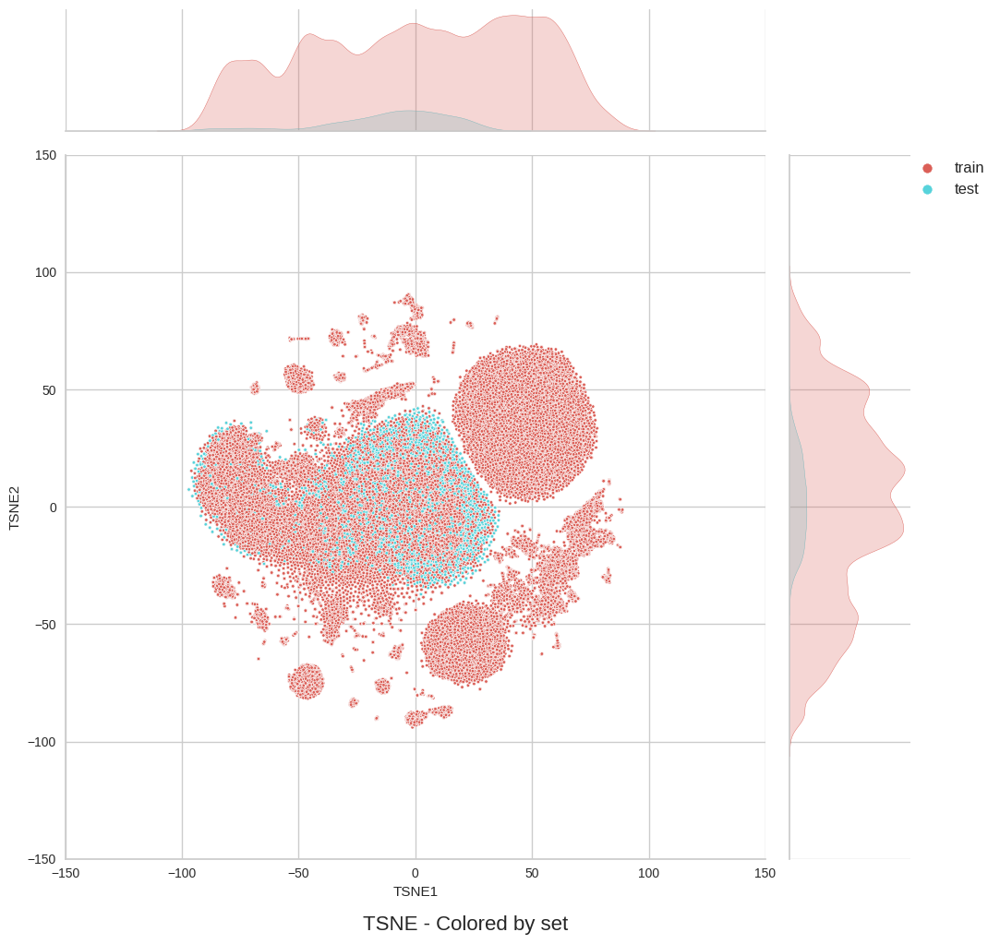

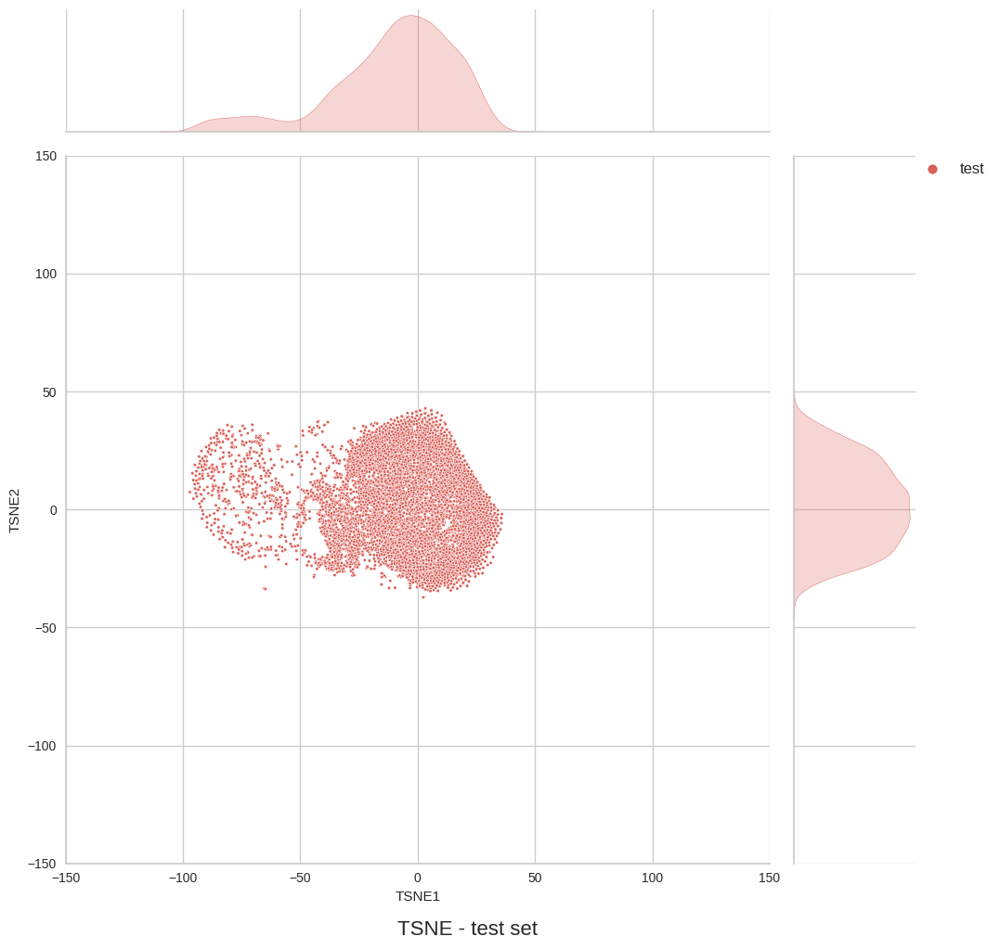

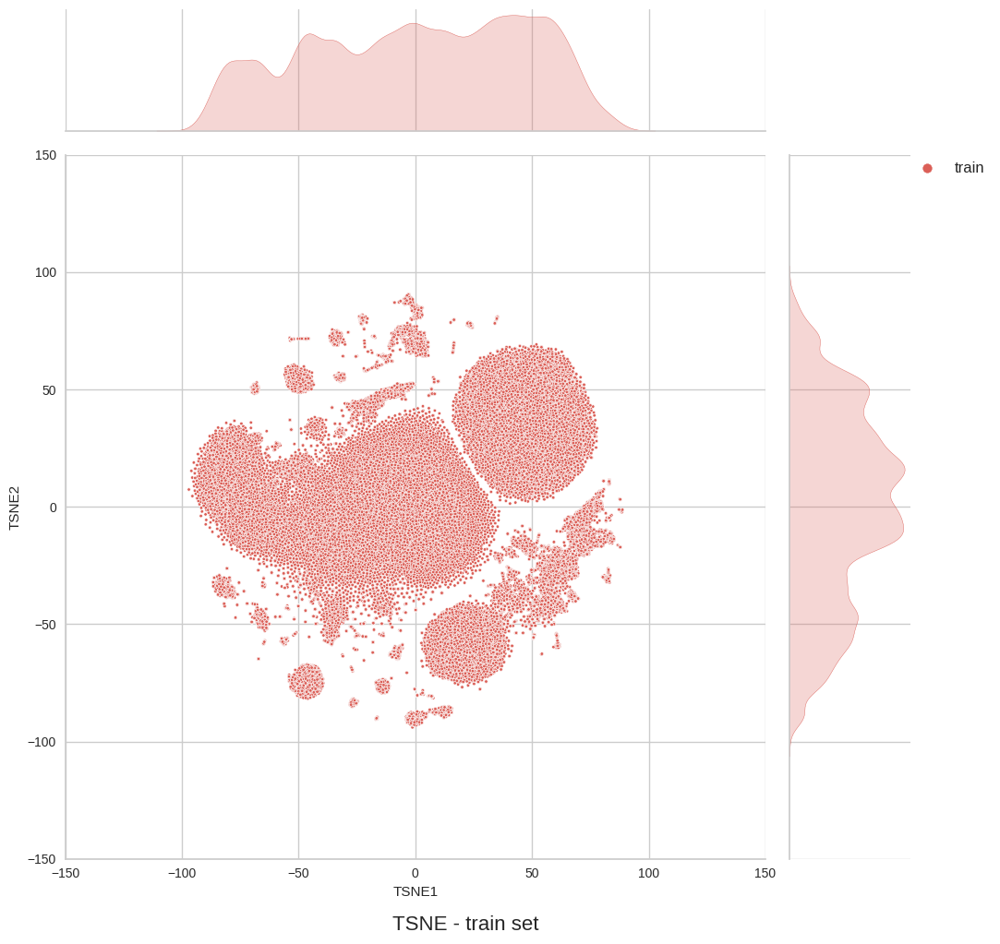

In [7]:
g = sns.jointplot(data=df_tsne, x='TSNE1', y='TSNE2', hue='set', palette='hls', height=10, ratio=5, marker=".", s=25)
g.set_axis_labels('TSNE1', 'TSNE2')

# Set xlim and ylim
g.ax_joint.set_xlim(-150, 150)
g.ax_joint.set_ylim(-150, 150)

# Legend outside the plot
plt.legend(bbox_to_anchor=(1.2, 1), loc=2, borderaxespad=0., prop={'size': 12})
g.fig.suptitle('TSNE - Colored by set', y=0.0, fontsize=16)
plt.show()

# Access each group separately
for group_name, group_data in grouped:
    g = sns.jointplot(data=group_data, x='TSNE1', y='TSNE2', hue='set', palette='hls', height=10, ratio=5, marker=".", s=25)
    g.set_axis_labels('TSNE1', 'TSNE2')

    # Set xlim and ylim
    g.ax_joint.set_xlim(-150, 150)
    g.ax_joint.set_ylim(-150, 150)
    
    # Legend outside the plot
    plt.legend(bbox_to_anchor=(1.2, 1), loc=2, borderaxespad=0., prop={'size': 12})
    g.fig.suptitle('TSNE - ' + group_name + ' set', y=0.0, fontsize=16)

    plt.show()

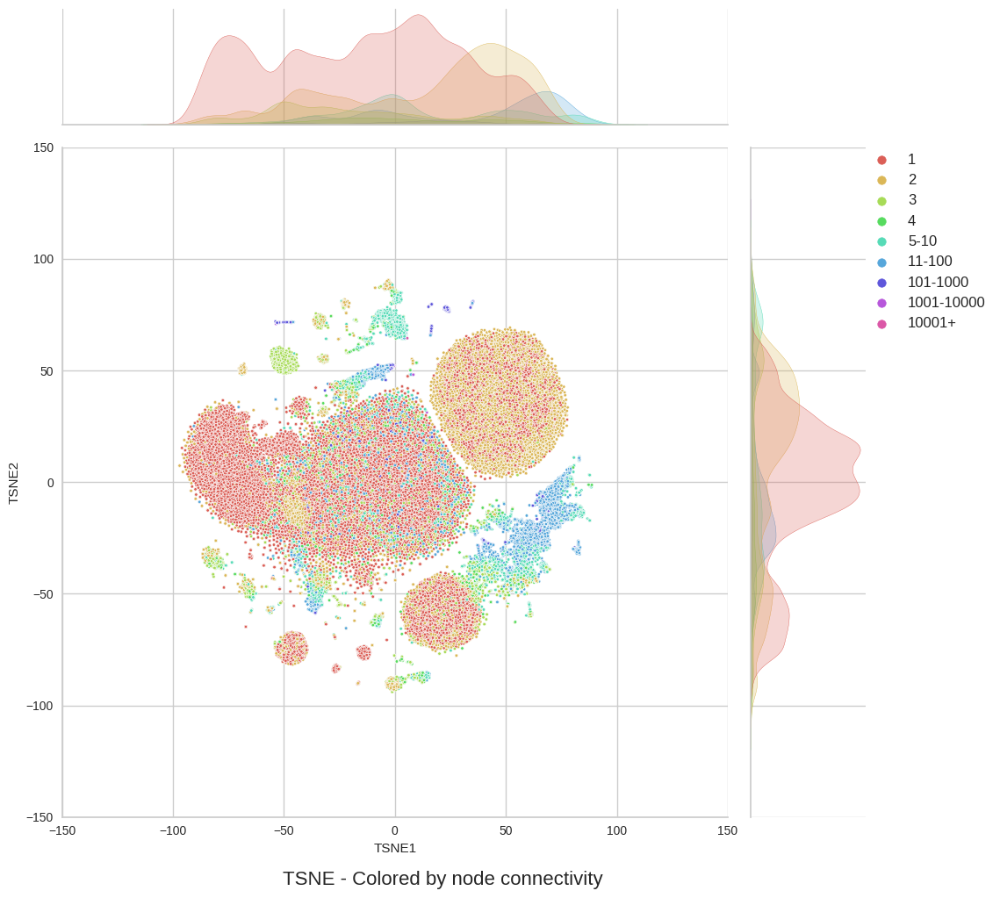

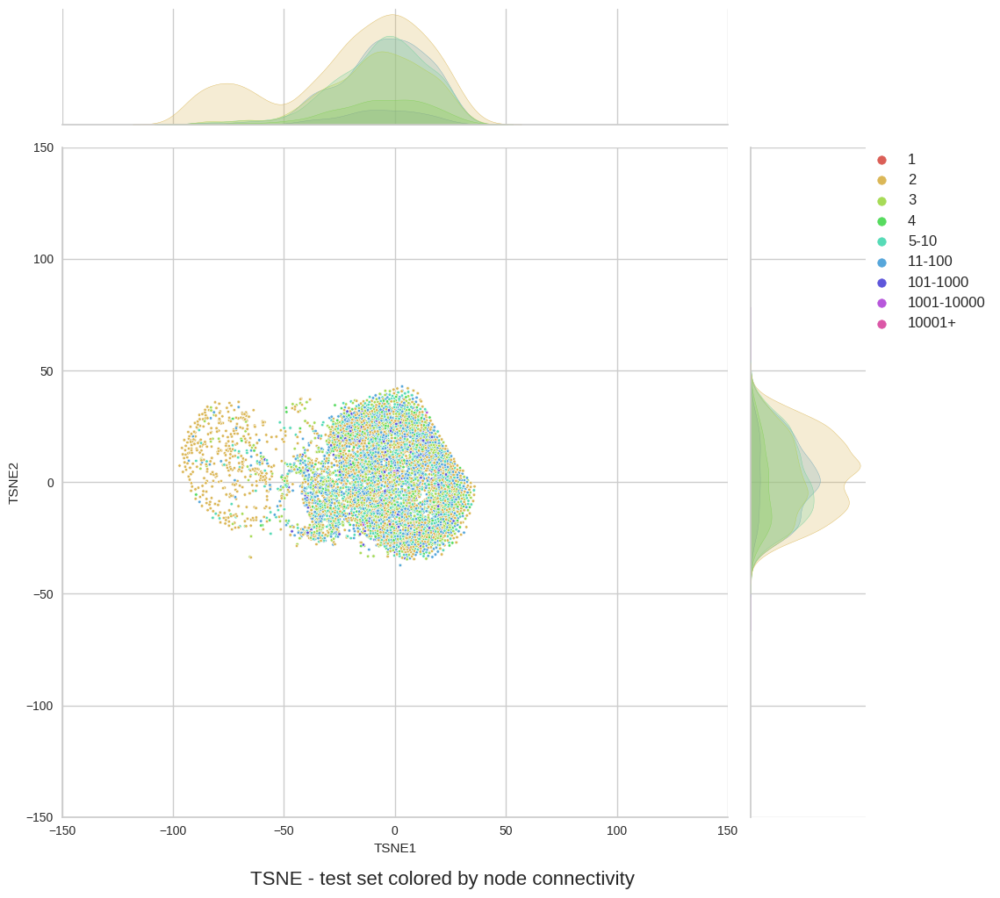

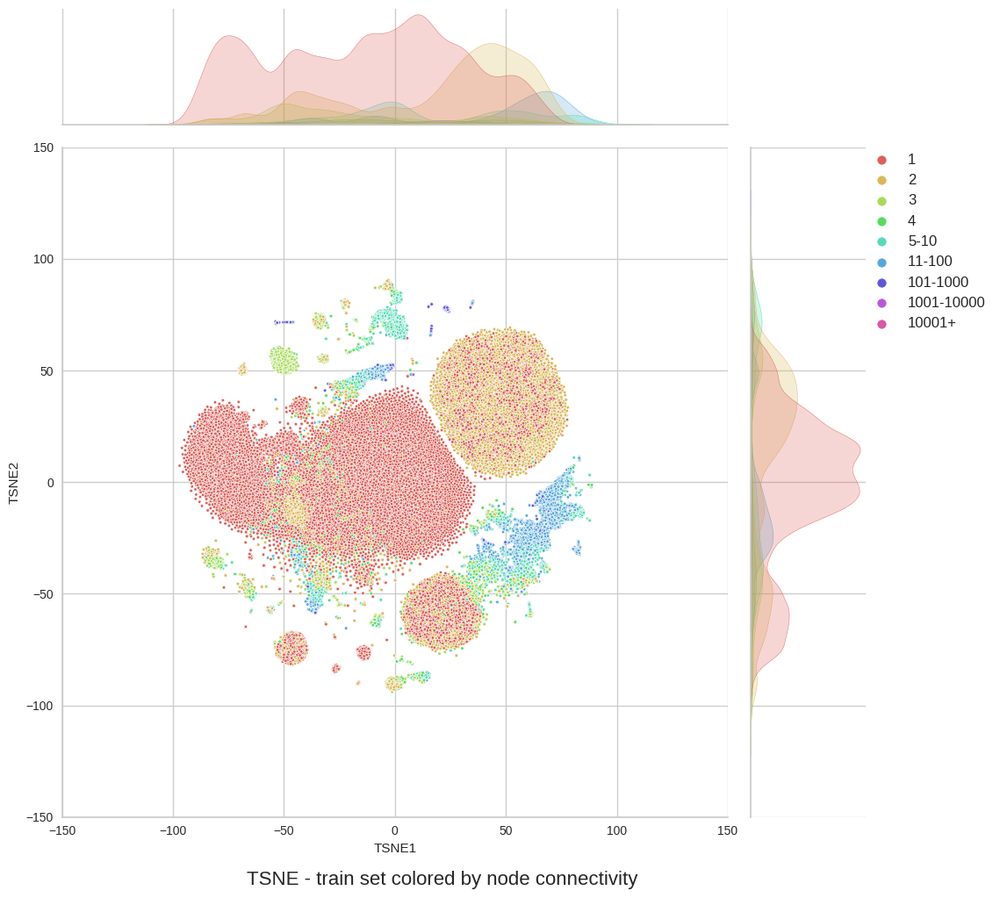

In [8]:
g = sns.jointplot(data=df_tsne, x='TSNE1', y='TSNE2', hue='grouped_connectivity', palette='hls', height=10, ratio=5, marker=".", s=25)
g.set_axis_labels('TSNE1', 'TSNE2')

# Set xlim and ylim
g.ax_joint.set_xlim(-150, 150)
g.ax_joint.set_ylim(-150, 150)

# Legend outside the plot
plt.legend(bbox_to_anchor=(1.2, 1), loc=2, borderaxespad=0., prop={'size': 12})
g.fig.suptitle('TSNE - Colored by node connectivity', y=0.0, fontsize=16)
plt.show()

# Access each group separately
for group_name, group_data in grouped:
    g = sns.jointplot(data=group_data, x='TSNE1', y='TSNE2', hue='grouped_connectivity', palette='hls', height=10, ratio=5, marker=".", s=25)
    g.set_axis_labels('TSNE1', 'TSNE2')

    # Set xlim and ylim
    g.ax_joint.set_xlim(-150, 150)
    g.ax_joint.set_ylim(-150, 150)
    
    # Legend outside the plot
    plt.legend(bbox_to_anchor=(1.2, 1), loc=2, borderaxespad=0., prop={'size': 12})
    g.fig.suptitle('TSNE - ' + group_name + ' set colored by node connectivity', y=0.0, fontsize=16)

    plt.show()

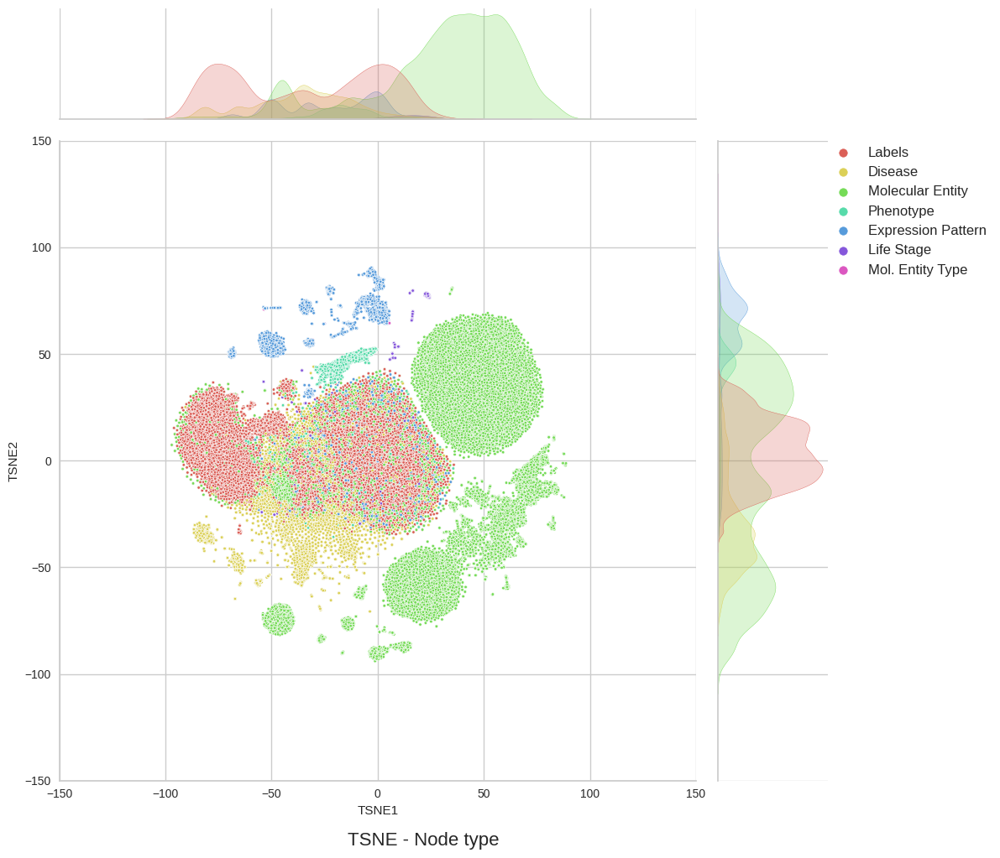

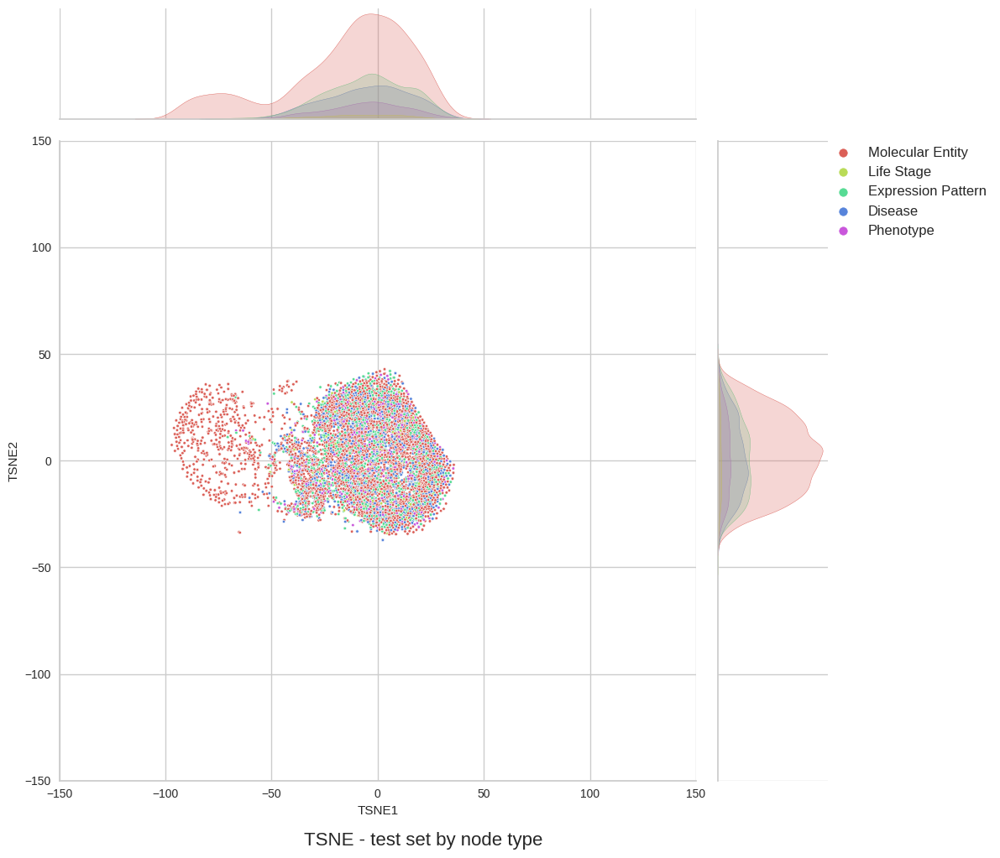

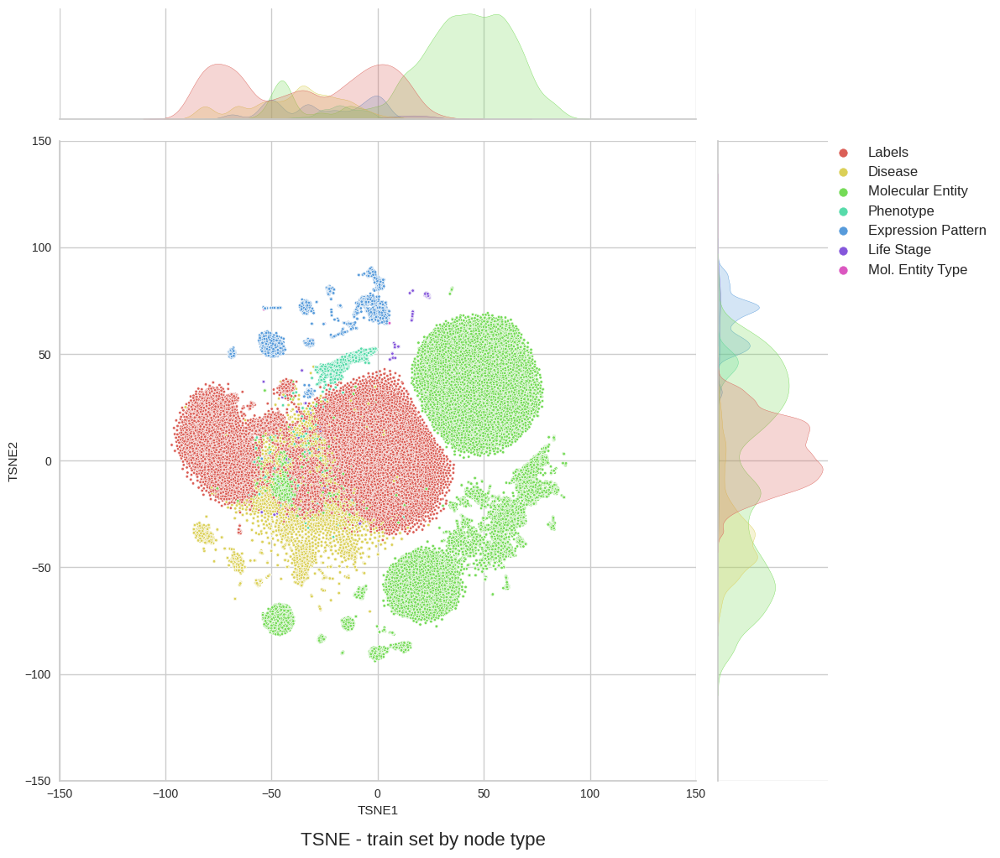

In [9]:
g = sns.jointplot(data=df_tsne, x='TSNE1', y='TSNE2', hue='node_type', palette='hls', height=10, ratio=5, marker=".", s=25)
g.set_axis_labels('TSNE1', 'TSNE2')

# Set xlim and ylim
g.ax_joint.set_xlim(-150, 150)
g.ax_joint.set_ylim(-150, 150)

# Legend outside the plot
plt.legend(bbox_to_anchor=(1.2, 1), loc=2, borderaxespad=0., prop={'size': 12})
g.fig.suptitle('TSNE - Node type', y=0.0, fontsize=16)
plt.show()

# Access each group separately
for group_name, group_data in grouped:
    g = sns.jointplot(data=group_data, x='TSNE1', y='TSNE2', hue='node_type', palette='hls', height=10, ratio=5, marker=".", s=25)
    g.set_axis_labels('TSNE1', 'TSNE2')

    # Set xlim and ylim
    g.ax_joint.set_xlim(-150, 150)
    g.ax_joint.set_ylim(-150, 150)
    
    # Legend outside the plot
    plt.legend(bbox_to_anchor=(1.2, 1), loc=2, borderaxespad=0., prop={'size': 12})
    g.fig.suptitle('TSNE - ' + group_name + ' set by node type', y=0.0, fontsize=16)

    plt.show()

In [10]:
for group_name, group_data in grouped:
    print(group_data['node_type'].value_counts())



Molecular Entity      3997
Expression Pattern    1367
Disease               1099
Phenotype              500
Life Stage             129
Name: node_type, dtype: int64
Molecular Entity      45192
Labels                28694
Disease                9905
Expression Pattern     6029
Phenotype              2133
Life Stage              645
Mol. Entity Type          9
Name: node_type, dtype: int64


In [20]:
df_tsnex = df_tsne
# merge the two dataframes
dfy = pd.concat([df1, df2], axis=0)

# Count the number of times a node appears in the dataset and add the count as a column
dfy['connectivity'] = dfy.groupby('node')['node'].transform('count')

dfy

,0,1,2,3,4,5,6,7,8,9,...,93,94,95,96,97,98,99,node,set,connectivity
0,-0.063572,0.042947,-0.020576,0.076487,0.004286,-0.080103,-0.018370,0.054732,-0.073183,0.012134,...,0.055775,0.026231,-0.020338,0.016612,0.012296,-0.050854,-0.106157,https://wormbase.org/species/c_elegans/gene/WB...,train,401
1,-0.034408,-0.039379,-0.041705,0.016972,0.036839,0.030759,0.015173,-0.023861,0.022699,-0.002807,...,-0.025265,0.031450,0.037983,-0.019300,0.001840,0.030466,0.017009,https://wormbase.org/species/c_elegans/gene/WB...,train,3
2,-0.068742,-0.059267,-0.031678,0.046586,-0.004413,0.066507,-0.020109,-0.060134,0.065552,-0.027575,...,-0.039118,0.020811,0.044948,-0.013038,0.000855,0.063203,0.015498,https://wormbase.org/species/c_elegans/gene/WB...,train,24
3,-0.068490,-0.066202,-0.032557,0.061942,-0.004055,0.063589,-0.009571,-0.055806,0.057752,-0.032322,...,-0.059228,0.017089,0.048007,-0.030642,-0.009236,0.048486,-0.011771,https://wormbase.org/species/c_elegans/gene/WB...,train,70
4,0.022260,0.028051,-0.039697,0.025357,0.036425,-0.037961,-0.032076,-0.030062,0.028645,-0.029327,...,-0.037591,0.040668,-0.029962,0.028287,0.023517,-0.039317,0.029349,https://wormbase.org/species/c_elegans/gene/WB...,train,372
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
391719,0.017882,0.000771,-0.002626,-0.014866,0.011263,-0.006492,-0.017113,0.000837,-0.021008,0.005289,...,0.025180,0.005912,-0.021865,-0.008104,-0.003813,-0.021491,-0.019171,https://wormbase.org/search/life_stage/0000021,test,1513
391720,0.025157,0.012519,0.013953,0.022862,0.026269,0.001353,-0.012850,0.027269,-0.005856,0.019217,...,0.018674,0.022702,0.000721,-0.016443,0.024818,-0.024366,-0.024455,http://semanticscience.org/resource/SIO_000790,test,24404
391721,0.033377,-0.030281,-0.003571,-0.001670,0.012281,0.017930,-0.001281,-0.001094,-0.000976,0.000844,...,0.011735,-0.001538,-0.014020,-0.000058,-0.009329,-0.005229,-0.022455,https://wormbase.org/species/c_elegans/gene/WB...,test,20
391722,0.008043,-0.035363,-0.026544,-0.009370,0.002851,0.019053,-0.007398,-0.012757,-0.015520,0.023613,...,0.020537,0.000260,-0.012139,-0.029591,-0.018536,-0.003055,-0.013181,https://wormbase.org/search/life_stage/0000041,test,8771


In [21]:
merged_df = pd.merge(dfy, df_tsnex[['node', 'TSNE1', 'TSNE2']], on='node')
merged_df

,0,1,2,3,4,5,6,7,8,9,...,95,96,97,98,99,node,set,connectivity,TSNE1,TSNE2
0,-0.063572,0.042947,-0.020576,0.076487,0.004286,-0.080103,-0.018370,0.054732,-0.073183,0.012134,...,-0.020338,0.016612,0.012296,-0.050854,-0.106157,https://wormbase.org/species/c_elegans/gene/WB...,train,401,39.655033,-25.577703
1,-0.063572,0.042947,-0.020576,0.076487,0.004286,-0.080103,-0.018370,0.054732,-0.073183,0.012134,...,-0.020338,0.016612,0.012296,-0.050854,-0.106157,https://wormbase.org/species/c_elegans/gene/WB...,train,401,39.655033,-25.577703
2,-0.063572,0.042947,-0.020576,0.076487,0.004286,-0.080103,-0.018370,0.054732,-0.073183,0.012134,...,-0.020338,0.016612,0.012296,-0.050854,-0.106157,https://wormbase.org/species/c_elegans/gene/WB...,train,401,39.655033,-25.577703
3,-0.063572,0.042947,-0.020576,0.076487,0.004286,-0.080103,-0.018370,0.054732,-0.073183,0.012134,...,-0.020338,0.016612,0.012296,-0.050854,-0.106157,https://wormbase.org/species/c_elegans/gene/WB...,train,401,39.655033,-25.577703
4,-0.063572,0.042947,-0.020576,0.076487,0.004286,-0.080103,-0.018370,0.054732,-0.073183,0.012134,...,-0.020338,0.016612,0.012296,-0.050854,-0.106157,https://wormbase.org/species/c_elegans/gene/WB...,train,401,39.655033,-25.577703
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
783443,0.003965,-0.010658,-0.008213,0.017848,0.022696,0.012674,-0.018357,-0.011244,-0.004919,0.012038,...,-0.012336,0.006739,-0.005354,-0.029818,-0.027313,21ur-6872,train,1,-6.419772,-23.555851
783444,-0.002650,-0.023459,-0.002007,-0.022172,-0.001679,0.011713,-0.013744,-0.003807,0.000780,0.027070,...,-0.008851,0.002154,-0.001292,-0.000264,0.004637,chil-6,train,1,-69.118958,-2.115870
783445,-0.002575,-0.027280,-0.012600,-0.027828,0.014074,0.007285,-0.015328,-0.002524,-0.004430,0.016990,...,-0.025810,-0.010446,-0.014613,-0.028300,-0.017121,mir-1833,train,1,-69.429985,4.410473
783446,-0.000644,-0.027823,-0.016692,-0.011728,-0.007962,0.018800,-0.009971,-0.004881,-0.000081,0.009032,...,-0.020187,0.000555,-0.005804,-0.010353,0.004379,spp-11,train,1,-62.849014,-13.684553


In [22]:
merged_df = merged_df.sample(frac=1)  # Shuffle the DataFrame

# Reset the index of the shuffled DataFrame
merged_df = merged_df.reset_index(drop=True)
merged_df = merged_df.drop_duplicates()
merged_df = merged_df.reset_index(drop=True)

groupedx = merged_df.groupby('set')
merged_df

,0,1,2,3,4,5,6,7,8,9,...,95,96,97,98,99,node,set,connectivity,TSNE1,TSNE2
0,-0.030615,-0.045364,-0.030369,0.057993,-0.001351,0.036736,0.037168,-0.031204,0.051799,0.028315,...,0.041876,-0.017928,-0.035946,0.054665,-0.048088,https://wormbase.org/species/c_elegans/gene/WB...,train,61,67.666595,-7.566428
1,-0.071348,0.048579,-0.029065,0.078502,-0.003698,-0.058523,-0.019110,0.060660,-0.075243,0.031190,...,-0.013235,0.017315,-0.010575,-0.015767,-0.045073,https://wormbase.org/species/c_elegans/gene/WB...,train,724,39.706516,-25.637030
2,0.009253,-0.007109,-0.010326,-0.028684,0.021356,0.003819,-0.007420,-0.006135,-0.011307,0.003525,...,-0.022060,-0.000055,-0.008897,-0.016341,0.004719,zmp-4,train,1,-70.321533,5.078108
3,-0.022423,-0.017296,-0.037435,-0.007842,0.028460,0.031006,0.030696,-0.037744,-0.001631,-0.002931,...,0.028926,-0.012884,0.016350,0.022954,0.009732,https://wormbase.org/species/c_elegans/gene/WB...,train,2,20.321085,-52.795898
4,-0.035641,-0.033622,-0.034391,-0.037305,-0.038560,0.034482,0.029428,0.034568,-0.022817,0.028195,...,-0.031225,-0.021678,0.034904,0.029355,0.025022,https://wormbase.org/species/all/expr_pattern/...,train,93,-46.862888,71.817062
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
131677,0.021134,-0.025936,-0.036249,-0.041598,-0.012412,-0.008162,0.023927,-0.031736,-0.019808,-0.028222,...,0.019709,-0.022353,-0.026058,0.008061,0.008331,https://wormbase.org/species/c_elegans/gene/WB...,train,1,-45.305775,-74.107758
131678,-0.001864,0.012396,0.011968,-0.001330,0.013969,-0.000652,-0.012839,0.004937,-0.014253,-0.005184,...,0.009610,0.018619,-0.017333,-0.007804,-0.033105,https://wormbase.org/species/all/phenotype/WBP...,train,2,-19.367933,40.348454
131679,-0.017877,-0.020954,-0.029420,-0.020093,0.018520,0.022274,0.014939,-0.026669,0.005021,0.013122,...,0.018016,-0.022028,0.014712,0.026295,0.017091,https://wormbase.org/species/c_elegans/gene/WB...,train,1,15.766160,-68.784348
131680,0.024800,-0.019671,0.011042,-0.008890,0.020060,0.009152,-0.000551,-0.009902,-0.001039,0.016777,...,-0.007851,-0.017365,-0.012686,-0.000309,-0.025901,https://wormbase.org/species/all/phenotype/WBP...,test,3,28.037180,-1.042564


In [23]:
# Create a new column with the merged string excluding the last index
merged_df['node_type'] = merged_df['node'].apply(lambda x: '/'.join(x[:-1]))
merged_df['node_type'] = merged_df['node'].replace('', 'labels')

# Define the ranges and labels for the connectivity groups
ranges = [0, 1, 2, 3, 4, 10, 100, 1000, 10000, float('inf')]
labels = ['1', '2', '3', '4', '5-10', '11-100', '101-1000', '1001-10000', '10001+']

# Create the 'grouped_connectivity' column
merged_df['grouped_connectivity'] = pd.cut(merged_df['connectivity'], bins=ranges, labels=labels, right=True)

# Function to replace the column values
def replace_url(url):
    parts = url.split('-')
    if len(parts) > 1:
        url = url.replace('-' + parts[-1], '')
        if 'https' in url:
            return url
        else:
            return ''
    else:
        return '/'.join(url.split('/')[:-1])

# Create a new column with the merged string excluding the last index
merged_df['node_type'] = merged_df['node_type'].apply(replace_url)
merged_df['node_type'] = merged_df['node_type'].replace('', 'labels')

print(merged_df['node_type'].unique())

# Define the dictionary mapping
replacement_dict = {
    'https://wormbase.org/wbdata/ortho_dis': 'Ortholog disease',
    'https://wormbase.org/wbdata/pheno': 'Phenotype Annotation',
    'https://wormbase.org/wbinter': 'Interaction Annotation',
    'https://wormbase.org/wbdata/dis': 'Disease Annotation',
    'https://disease': 'Disease',
    'https://wormbase.org/search/life_stage': 'Life Stage',
    'https://wormbase.org/species/c_elegans/gene': 'Molecular Entity',
    'https://wormbase.org/species/all/phenotype': 'Phenotype',
    'https://wormbase.org/wbdata/dev': 'Development Annotation',

    'http://semanticscience.org/resource': 'Mol. Entity Type',
    'https://wormbase.org/species/all/expr_pattern': 'Expression Pattern',

    'labels': 'Labels'
}

# Replace instances in 'node_type' column
merged_df['node_type'] = merged_df['node_type'].replace(replacement_dict)

['https://wormbase.org/species/c_elegans/gene' 'labels'
 'https://wormbase.org/species/all/expr_pattern'
 'https://wormbase.org/species/all/phenotype' 'https://disease'
 'https://wormbase.org/search/life_stage'
 'http://semanticscience.org/resource']


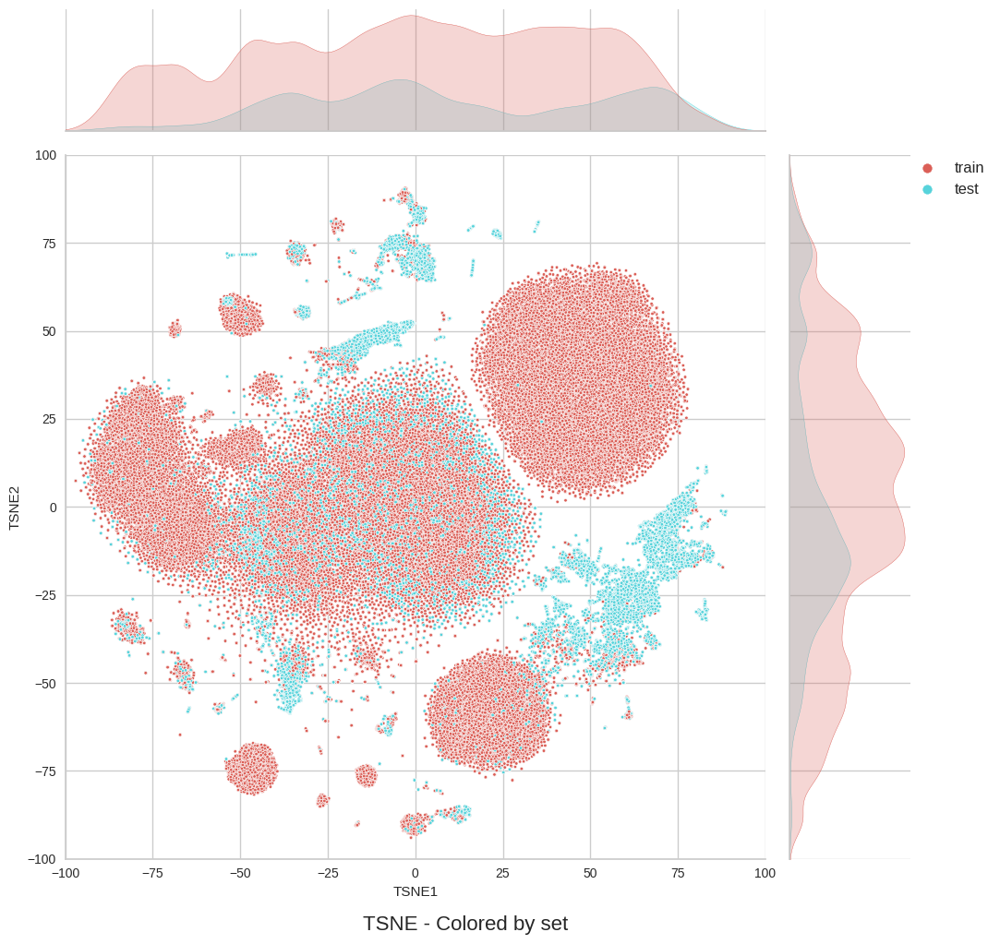

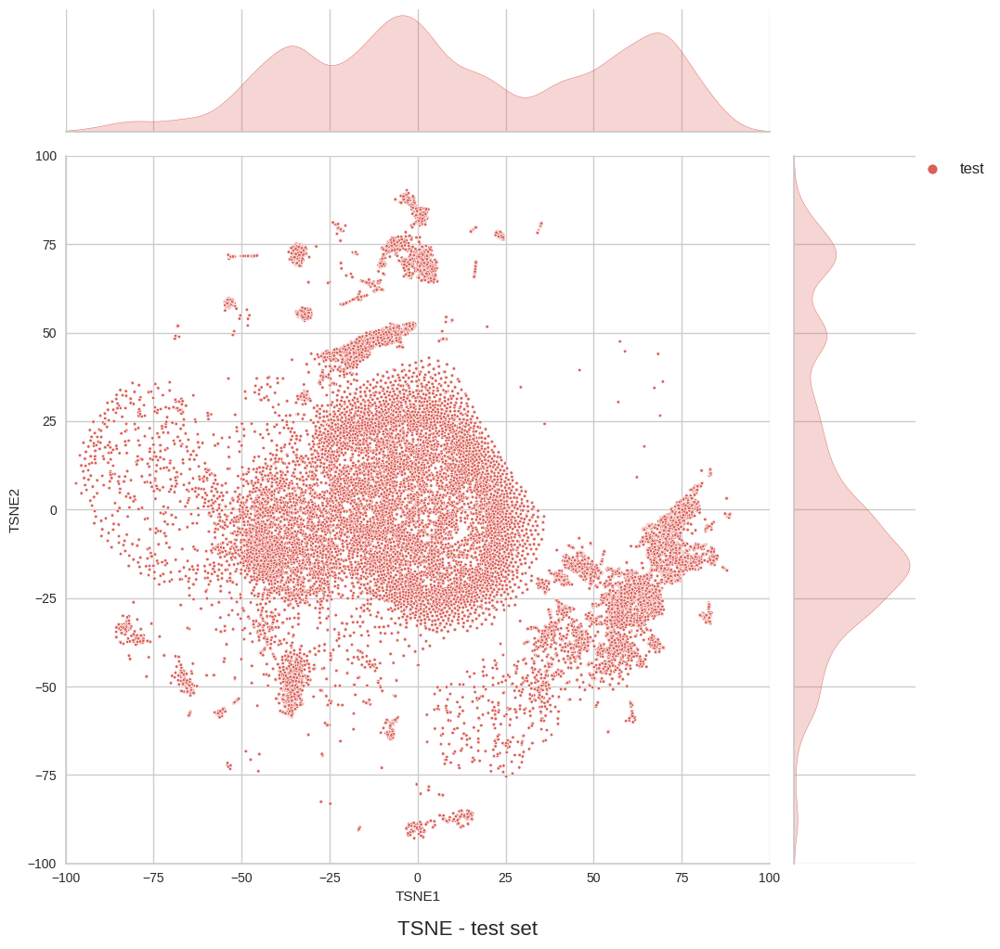

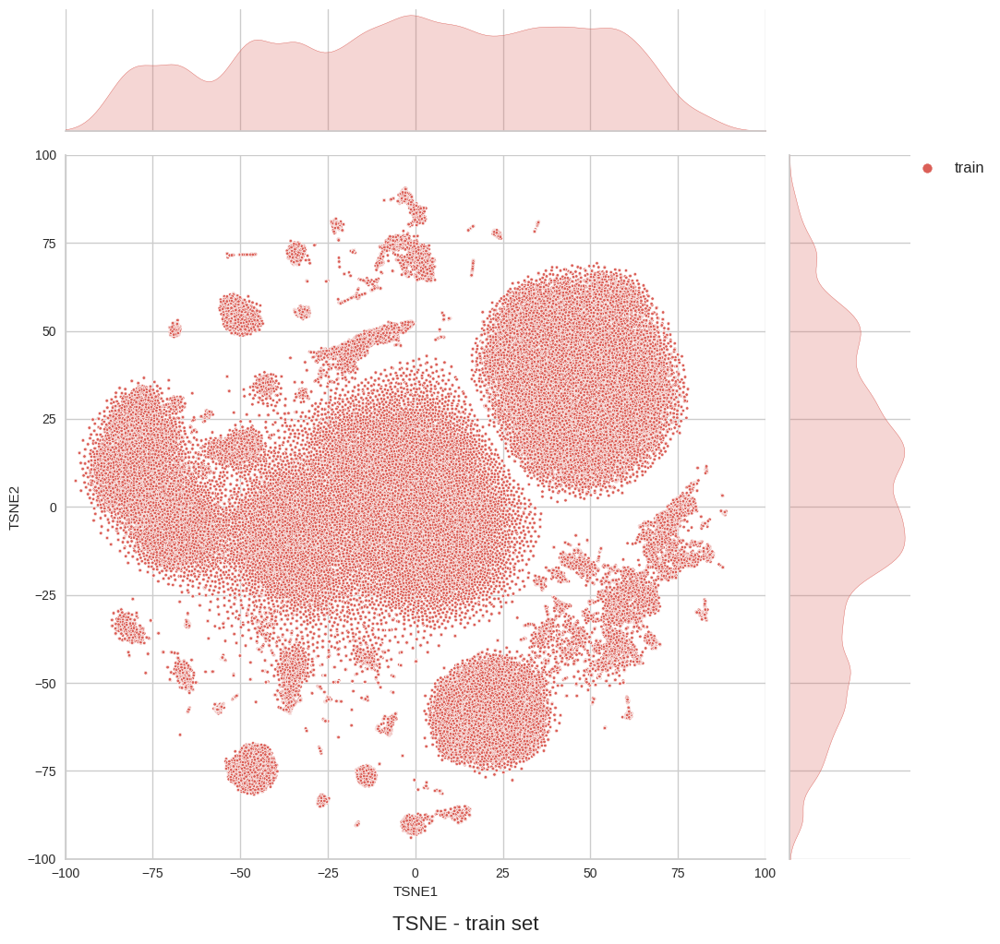

In [24]:
g = sns.jointplot(data=merged_df, x='TSNE1', y='TSNE2', hue='set', palette='hls', height=10, ratio=5, marker=".", s=25)
g.set_axis_labels('TSNE1', 'TSNE2')

# Set xlim and ylim
g.ax_joint.set_xlim(-100, 100)
g.ax_joint.set_ylim(-100, 100)

# Legend outside the plot
plt.legend(bbox_to_anchor=(1.2, 1), loc=2, borderaxespad=0., prop={'size': 12})
g.fig.suptitle('TSNE - Colored by set', y=0.0, fontsize=16)
plt.show()

# Access each group separately
for group_name, group_data in groupedx:
    g = sns.jointplot(data=group_data, x='TSNE1', y='TSNE2', hue='set', palette='hls', height=10, ratio=5, marker=".", s=25)
    g.set_axis_labels('TSNE1', 'TSNE2')

    # Set xlim and ylim
    g.ax_joint.set_xlim(-100, 100)
    g.ax_joint.set_ylim(-100, 100)
    
    # Legend outside the plot
    plt.legend(bbox_to_anchor=(1.2, 1), loc=2, borderaxespad=0., prop={'size': 12})
    g.fig.suptitle('TSNE - ' + group_name + ' set', y=0.0, fontsize=16)

    plt.show()

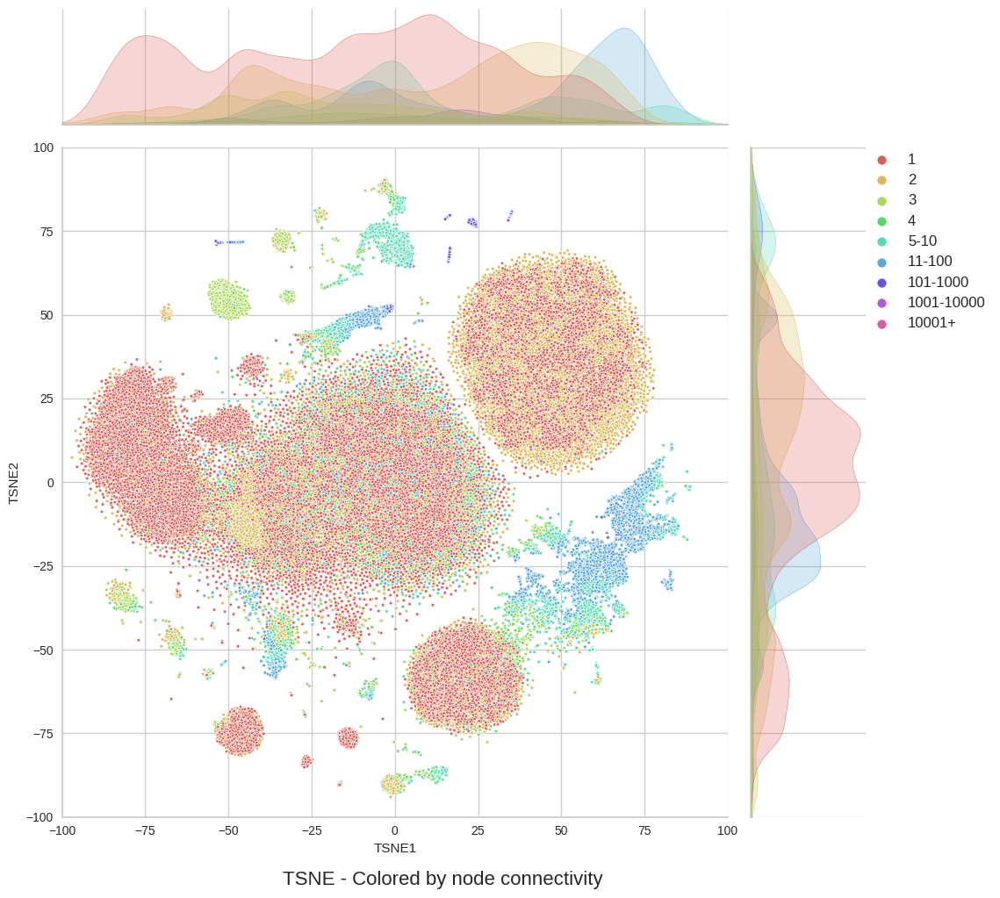

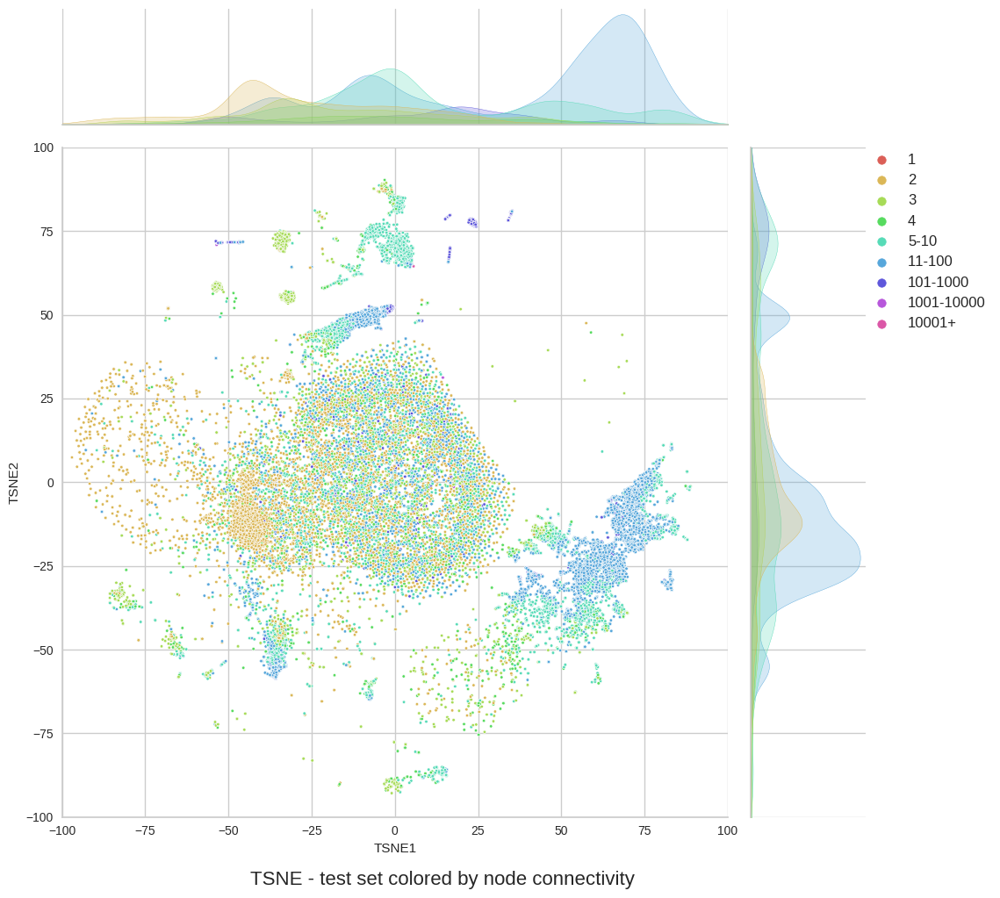

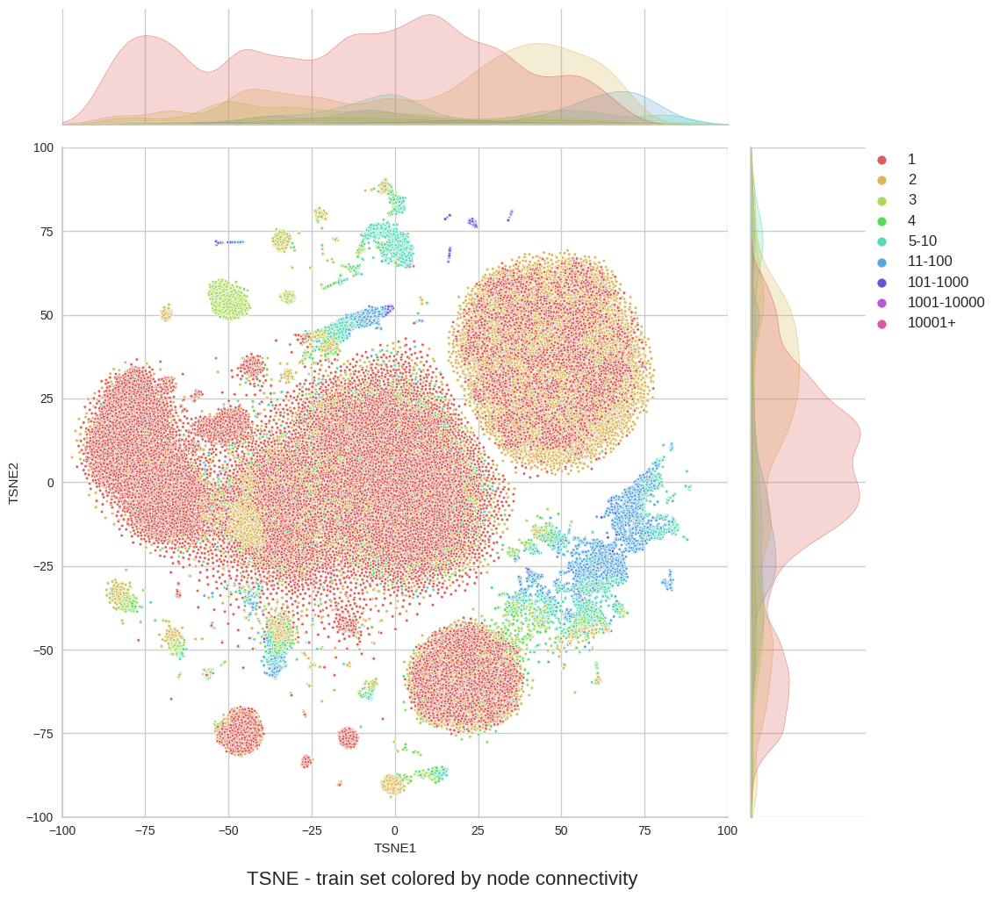

In [26]:
g = sns.jointplot(data=merged_df, x='TSNE1', y='TSNE2', hue='grouped_connectivity', palette='hls', height=10, ratio=5, marker=".", s=25)
g.set_axis_labels('TSNE1', 'TSNE2')

# Set xlim and ylim
g.ax_joint.set_xlim(-100, 100)
g.ax_joint.set_ylim(-100, 100)

# Legend outside the plot
plt.legend(bbox_to_anchor=(1.2, 1), loc=2, borderaxespad=0., prop={'size': 12})
g.fig.suptitle('TSNE - Colored by node connectivity', y=0.0, fontsize=16)
plt.show()

# Access each group separately
for group_name, group_data in groupedx:
    g = sns.jointplot(data=group_data, x='TSNE1', y='TSNE2', hue='grouped_connectivity', palette='hls', height=10, ratio=5, marker=".", s=25)
    g.set_axis_labels('TSNE1', 'TSNE2')

    # Set xlim and ylim
    g.ax_joint.set_xlim(-100, 100)
    g.ax_joint.set_ylim(-100, 100)
    
    # Legend outside the plot
    plt.legend(bbox_to_anchor=(1.2, 1), loc=2, borderaxespad=0., prop={'size': 12})
    g.fig.suptitle('TSNE - ' + group_name + ' set colored by node connectivity', y=0.0, fontsize=16)

    plt.show()

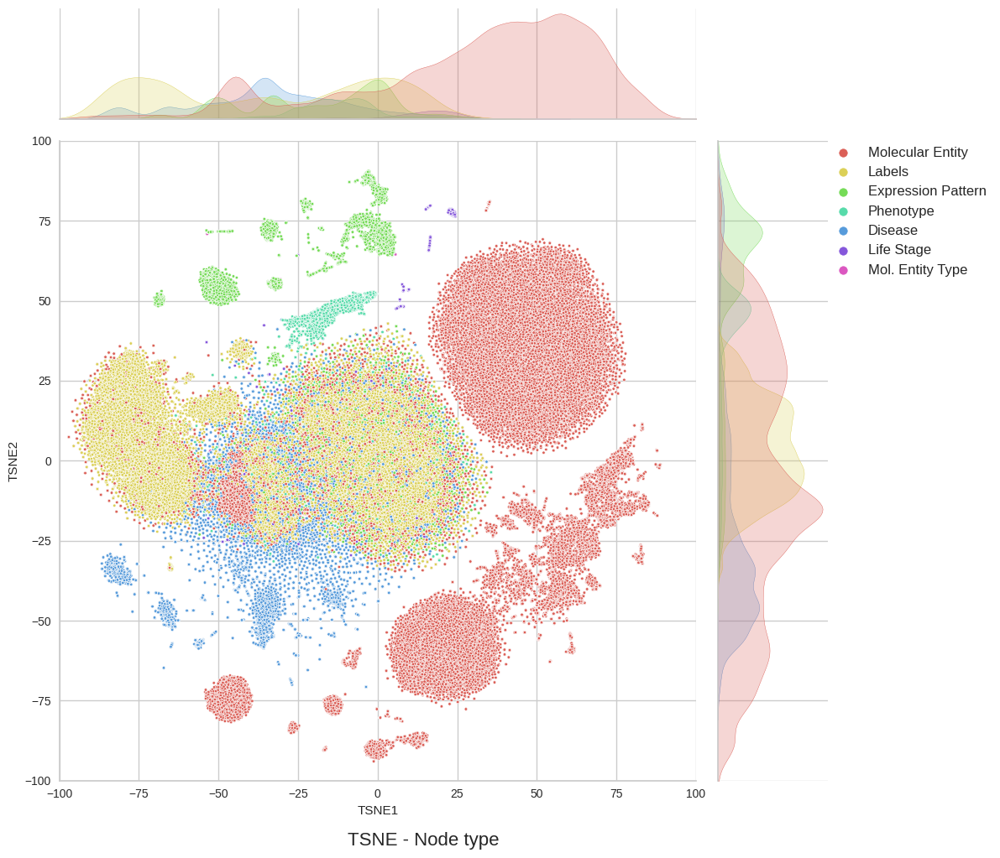

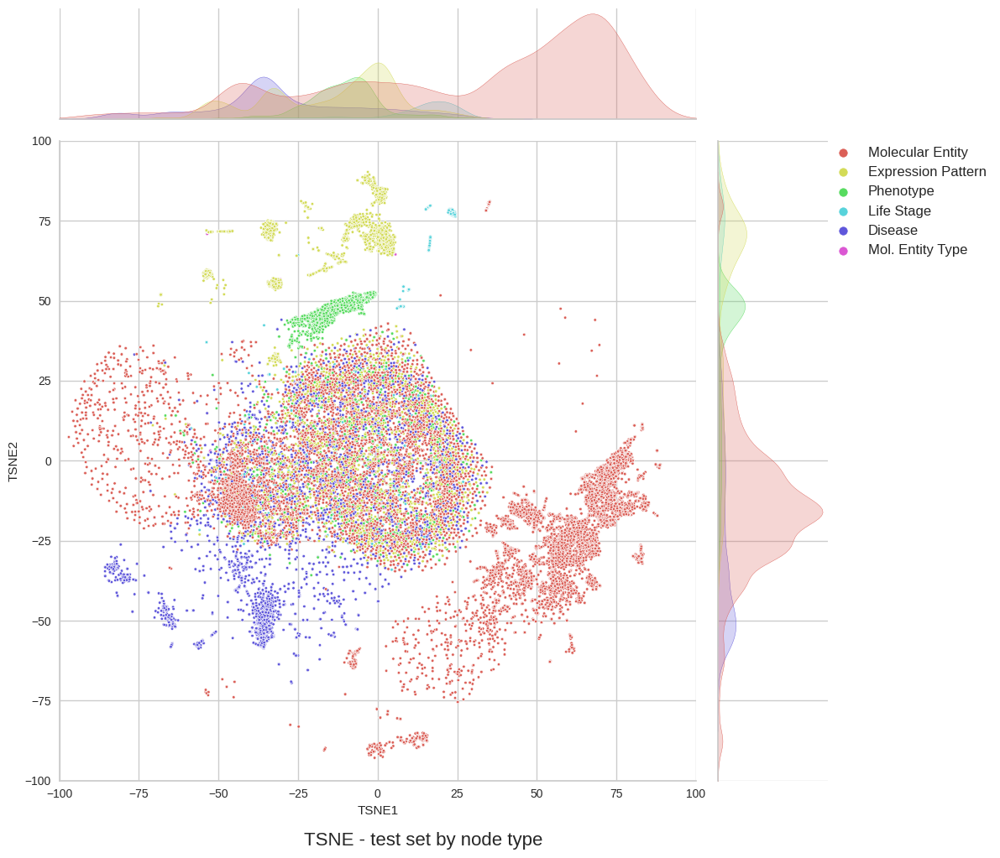

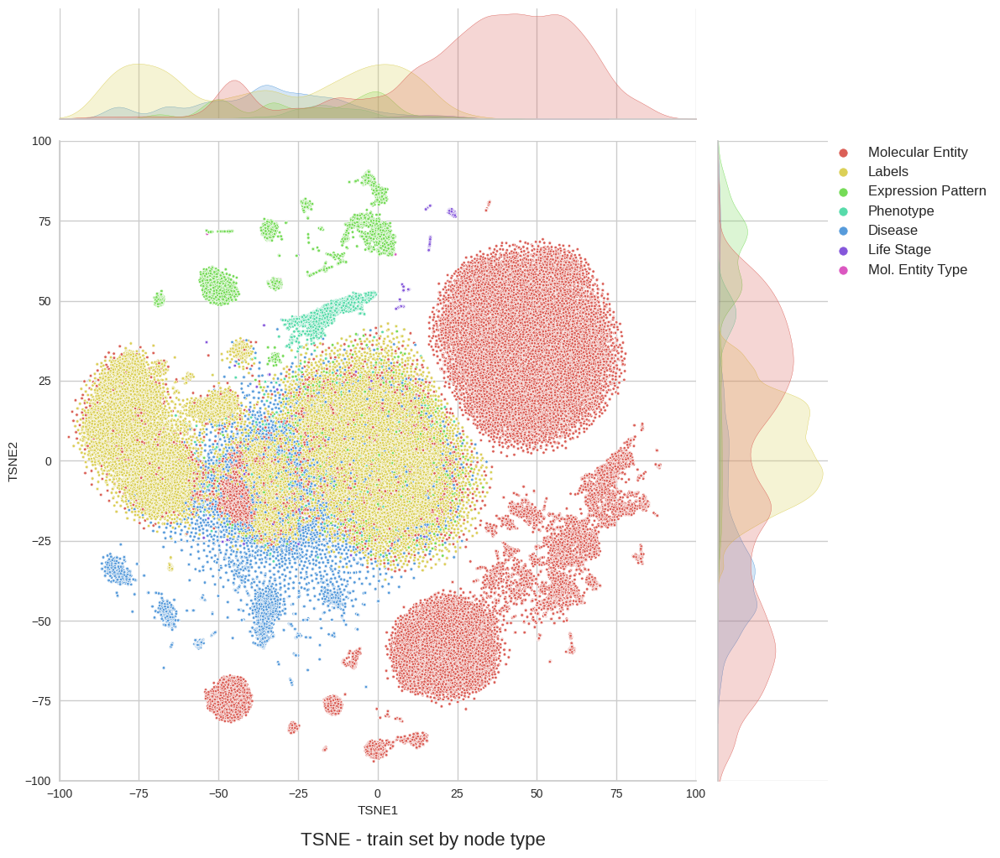

In [25]:
g = sns.jointplot(data=merged_df, x='TSNE1', y='TSNE2', hue='node_type', palette='hls', height=10, ratio=5, marker=".", s=25)
g.set_axis_labels('TSNE1', 'TSNE2')

# Set xlim and ylim
g.ax_joint.set_xlim(-100, 100)
g.ax_joint.set_ylim(-100, 100)

# Legend outside the plot
plt.legend(bbox_to_anchor=(1.2, 1), loc=2, borderaxespad=0., prop={'size': 12})
g.fig.suptitle('TSNE - Node type', y=0.0, fontsize=16)
plt.show()

# Access each group separately
for group_name, group_data in groupedx:
    g = sns.jointplot(data=group_data, x='TSNE1', y='TSNE2', hue='node_type', palette='hls', height=10, ratio=5, marker=".", s=25)
    g.set_axis_labels('TSNE1', 'TSNE2')

    # Set xlim and ylim
    g.ax_joint.set_xlim(-100, 100)
    g.ax_joint.set_ylim(-100, 100)
    
    # Legend outside the plot
    plt.legend(bbox_to_anchor=(1.2, 1), loc=2, borderaxespad=0., prop={'size': 12})
    g.fig.suptitle('TSNE - ' + group_name + ' set by node type', y=0.0, fontsize=16)

    plt.show()